In [3]:
%matplotlib inline
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow_addons.layers import *
from PIL import Image
import numpy as np
import glob
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
import os


In [4]:
#!unzip Summer2Winter.zip

In [5]:
#Normalize image data
def preprocess(records):
    images =  records['image']
    images = tf.cast(images, tf.float32)/255.0
    return images

#Convert image array as tensorflow dataset
def tf_pipeline(dataset):
    dataset = tf.data.Dataset.from_tensor_slices({'image':dataset})
    dataset = dataset.map(preprocess)
    dataset = dataset.repeat().shuffle(100).batch(16).prefetch(1)
    return dataset

#Read image data from domain A and B
def tf_data(path):
    trainingA = []
    for x in glob.glob(path+'A/*'):
        image = Image.open(x)
        image = image.resize((128,128))
        trainingA.append(np.array(image))
        
    trainingB = []
    for x in glob.glob(path+'B/*'):
        image = Image.open(x)
        image = image.resize((128,128))
        trainingB.append(np.array(image))
    a,b = tf_pipeline(trainingA),tf_pipeline(trainingB)
    return a.__iter__(),b.__iter__()
trainA,trainB = tf_data('train')

In [6]:
#Set hyperparameters
input_dim = (128,128,3) #input/output image dimension
depth = 4               #network depth  
kernel = 3              #kernel size for Conv2D
n_batch = 16            #batch_size
epochs = 20
steps = round(1500/n_batch) #steps per epoch, we have ~1500 samples per domain so calculating steps using it

In [7]:
from keras.layers import LeakyReLU

In [8]:
#Apply instance normalization after each convolutional layer to standardize values on each output feature map
#Apply leakyRelu activation with large alpha value of 0.2
def discriminator(input_dim,depth,kernel):
    layers = []
    layers.append(Input(shape=input_dim))
    for i in range(1,depth):
            layers.append(Conv2D(16*i, padding='same', kernel_size=kernel))
            layers.append(InstanceNormalization())
            layers.append(LeakyReLU(alpha=0.2))
            layers.append(Dropout(0.2))
    layers.append(Conv2D(1,kernel_size=kernel))
    model = Sequential(layers)
    model.compile(loss='mse',optimizer=tf.keras.optimizers.Adam())
    return model
#Define two discriminators for each domain
discriminator_A = discriminator(input_dim,depth,kernel)
discriminator_B = discriminator(input_dim,depth,kernel)


In [9]:
#Apply instance normalization after each convoluational layer 
#Apply leaky Relu activation 
def generator(input_dim, depth, kernel):
    layers = []
    layers.append(Input(shape=input_dim))
    for i in range(1,depth):
        layers.append(Conv2D(16*i, padding='same', kernel_size=kernel))
        layers.append(InstanceNormalization())
        layers.append(LeakyReLU(alpha=0.2))
        layers.append(Dropout(0.2))
        
    
    for i in range(1,depth):
        layers.append(Conv2DTranspose(16*i, padding='same', kernel_size=kernel))
        layers.append(InstanceNormalization())
        layers.append(LeakyReLU(alpha=0.2))
        layers.append(Dropout(0.2))
    
    resizer =  lambda name: Lambda(lambda images: tf.image.resize(images, [128,128]), name=name)
    layers.append(resizer('Reshape'))
    layers.append(Conv2DTranspose(3,kernel_size=1,activation=None))
    model = Sequential(layers)
    return model
#Define generators from A to B and from B to A
generator_A_B = generator(input_dim,depth,kernel)
generator_B_A = generator(input_dim,depth,kernel)


In [10]:
#Define composite model to build cyclic connection
#Only the first generator is trainable
#Define adversarial loss (using MSE), identity loss and cycle loss (using MAE), 
def composite_model(g1,d,g2,image_dim):
    g1.trainable = True
    g2.trainable = False
    d.trainable = False
    
    #Adversarial loss 
    input_img = Input(shape=input_dim)
    g1_out = g1(input_img)
    d_out = d(g1_out)
    
    #identity loss
    input_id = Input(shape=input_dim)
    g1_out_id = g1(input_id)
    
    #Cycle Loss, Forward cycle
    g2_out = g2(g1_out)
    
    #Cycle Loss, Backward-cycle
    g2_out_id = g2(input_id)
    output_g1 = g1(g2_out_id)
    
    model = Model([input_img,input_id],[d_out, g1_out_id, g2_out, output_g1])
    model.compile(loss=['mse','mae','mae','mae'],loss_weights=[1,5,10,10],optimizer=tf.keras.optimizers.Adam())
    return model
composite_A_B = composite_model(generator_A_B, discriminator_B, generator_B_A, input_dim)
composite_B_A = composite_model(generator_B_A, discriminator_A, generator_A_B, input_dim)

In [11]:
#Generate samples and lables for training 
#Labels are 2d array per image because of PatchGAN 
def generate_real(dataset, batch_size,patch_size):
    labels = np.ones((batch_size,patch_size,patch_size,1))
    return dataset,labels
def generate_fake(dataset,g,batch_size,patch_size):
    predicted = g(dataset)
    labels = np.zeros((batch_size,patch_size,patch_size,1))
    return predicted,labels

In [12]:
#Create checkpoints for the models 
checkpoint_dir = './CycleGAN3'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_A_B=generator_A_B, generator_B_A=generator_B_A,discriminator_A=discriminator_A,discriminator_B=discriminator_B,composite_A_B=composite_A_B, composite_B_A=composite_B_A)
manager = tf.train.CheckpointManager(checkpoint, 'training_checkpoints', max_to_keep=3)
checkpoint.restore(manager.latest_checkpoint)


In [13]:
#Defining training function, two composite models with discriminators are trained over the samples
def train(discriminator_A, discriminator_B, generator_A_B, generator_B_A, composite_A_B, composite_B_A, epochs, batch_size, steps):
    n_patch = discriminator_A.output_shape[1]
    
    for epoch in range(1,epochs):
        for step in range(1,steps):
            print(epoch,step)
            
            x_real_A, y_real_A = generate_real(next(trainA),n_batch,n_patch)
            x_real_B, y_real_B = generate_real(next(trainB),n_batch,n_patch)
            
            x_fake_A, y_fake_A = generate_fake(x_real_B, generator_B_A,n_batch,n_patch)
            x_fake_B, y_fake_B = generate_fake(x_real_A, generator_A_B,n_batch,n_patch)
            
            g_A_B_loss,_,_,_,_ = composite_A_B.train_on_batch([x_real_A,x_real_B],[y_real_B,x_real_B, x_real_A, x_real_B])
            disc_A_real_loss = discriminator_A.train_on_batch(x_real_A, y_real_A)
            disc_A_fake_loss = discriminator_A.train_on_batch(x_fake_A, y_fake_A)
            
            g_B_A_loss,_,_,_,_ = composite_B_A.train_on_batch([x_real_B,x_real_A],[y_real_A,x_real_A, x_real_B, x_real_A])
            disc_B_real_loss = discriminator_B.train_on_batch(x_real_B, y_real_B) 
            disc_B_fake_loss = discriminator_B.train_on_batch(x_fake_B, y_fake_B)
            
            print('g_A_B_loss',g_A_B_loss)
            print('g_B_A_loss',g_B_A_loss)
            
            manager.save()

In [14]:
#Model training with 20 epochs
train(discriminator_A, discriminator_B, generator_A_B, generator_B_A, composite_A_B, composite_B_A, epochs, n_batch, steps)

1 1
g_A_B_loss 24.87445640563965
g_B_A_loss 24.082462310791016
1 2
g_A_B_loss 22.500041961669922
g_B_A_loss 21.767086029052734
1 3
g_A_B_loss 20.879709243774414
g_B_A_loss 19.944486618041992
1 4
g_A_B_loss 18.476593017578125
g_B_A_loss 17.722610473632812
1 5
g_A_B_loss 16.733230590820312
g_B_A_loss 16.367923736572266
1 6
g_A_B_loss 15.315375328063965
g_B_A_loss 15.011810302734375
1 7
g_A_B_loss 14.447661399841309
g_B_A_loss 14.17446517944336
1 8
g_A_B_loss 13.02717399597168
g_B_A_loss 12.850914001464844
1 9
g_A_B_loss 13.345865249633789
g_B_A_loss 13.012234687805176
1 10
g_A_B_loss 12.469106674194336
g_B_A_loss 12.190516471862793
1 11
g_A_B_loss 12.265030860900879
g_B_A_loss 12.058002471923828
1 12
g_A_B_loss 12.032341003417969
g_B_A_loss 11.563762664794922
1 13
g_A_B_loss 11.546853065490723
g_B_A_loss 11.356998443603516
1 14
g_A_B_loss 11.113941192626953
g_B_A_loss 10.955097198486328
1 15
g_A_B_loss 11.160957336425781
g_B_A_loss 11.077155113220215
1 16
g_A_B_loss 10.796034812927246
g_

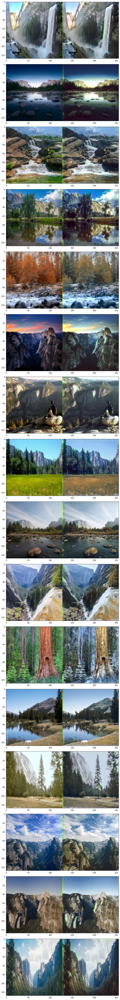

In [15]:
#Showing image translation results on test data (Summer to Winter)
testA,testB = tf_data('test')
x_real_A, _ = generate_real(next(testA),n_batch,0)
images_B,_ = generate_fake(x_real_A, generator_A_B,n_batch,0)
fig,ax = plt.subplots(n_batch,figsize=(75,75))
for index,img in enumerate(zip(x_real_A,images_B)):
    concat_numpy = np.clip(np.hstack((img[0],img[1])),0,1)
    ax[index].imshow(concat_numpy)
fig.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

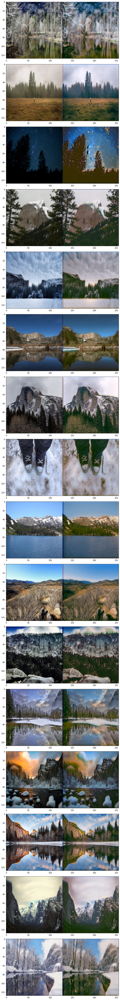

In [16]:
#Showing image translation results on test data (Winter to Summer)
x_real_B,_ = generate_real(next(testB),n_batch,0)
images_A,_ = generate_fake(x_real_B, generator_B_A,n_batch, 0)
fig,ax = plt.subplots(n_batch,figsize=(75,75))
for index,img in enumerate(zip(x_real_B,images_A)):
    concat_numpy = np.hstack((img[0],img[1]))
    ax[index].imshow(concat_numpy)
fig.tight_layout()

Reference: 
Mehul Gupta. (2021, Sep 14) Understanding CycleGANs using examples & Codes. Retrieved from 
https://medium.com/data-science-in-your-pocket/understanding-cyclegans-using-examples-codes-f5d6e1a47048